# Visualizing Geospatial Data
inspired from scipy2018-geospatial and geographic data science book

**goals of the tutorial**
- plot a map with matplotlib
- choropleth map
- hexagonal rappresentation

**based on the open data of:**
- ISTAT Italian National Institute of Statistic
- [AirBnB data](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/data/csv/airbnb_trentino_alto_adiige_may2019.csv) of Trentino Alto Adige - May 2019 by [Vincenzo Patruno](https://medium.com/@vincpatruno)
- [covid-19](https://github.com/pcm-dpc/COVID-19) - Italian Department of Civil Protection

**requirements**
- python knowledge
- geopandas

**suggestion**<br/>
follow the [30DayMapChallenge](https://github.com/tjukanovt/30DayMapChallenge) - daily social mapping project in November 2020 - hashtag Twitter [#30DayMapChallege](https://twitter.com/hashtag/30DayMapChallenge) 




**status**<br/>
"*the map is not the territory*" 

---



# Packages to use
- pandas
- pandas profile
- geopandas
- contextily 
- seaborn
- sklearn
- mapclassify


In [1]:
!pip install -U pandas-profiling

     |████████████████████████████████| 266kB 2.7MB/s 
     |████████████████████████████████| 71kB 5.5MB/s 
     |████████████████████████████████| 71kB 5.4MB/s 
     |████████████████████████████████| 3.1MB 8.4MB/s 
     |████████████████████████████████| 71kB 7.9MB/s 
     |████████████████████████████████| 604kB 31.8MB/s 
     |████████████████████████████████| 296kB 30.7MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27085 sha256=917a3f7dfd494434a9bffc24c11dfdde405745dd56745988aaf0d760d520d5fa
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for imagehash: filename=ImageHash-4.1.0-py2.py3-none-any.whl size=291991 sha256=d818b89f3319b03328a3486124b0c7402d9f91a79d398579565472c2db380f6e
  Stored in directory: /root/.cache/pip/wheels/07/1c/dc/6831446f09feb8cc199ec73a0f2f0703253f6ae013a22f4be9
Successfully built htmlmin imagehash
  Found existing installation: tqdm 4.41.1
    Uni

In [2]:
try:
  import rtree
except ModuleNotFoundError as e:
  !apt-get install libspatialindex-dev
  !pip install rtree
  import rtree

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libspatialindex-c4v5 libspatialindex4v5
The following NEW packages will be installed:
  libspatialindex-c4v5 libspatialindex-dev libspatialindex4v5
0 upgraded, 3 newly installed, 0 to remove and 11 not upgraded.
Need to get 555 kB of archives.
After this operation, 3,308 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex4v5 amd64 1.8.5-5 [219 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex-c4v5 amd64 1.8.5-5 [51.7 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex-dev amd64 1.8.5-5 [285 kB]
Fetched 555 kB in 1s (747 kB/s)
Selecting previously unselected package libspatialindex4v5:amd64.
(Reading database ... 144628 files and directories currently installed.)
Preparing to unpack .../libspatialindex4v5_1.8.5-5_

In [3]:
!pip install geopandas

     |████████████████████████████████| 972kB 2.7MB/s 
     |████████████████████████████████| 14.8MB 281kB/s 
     |████████████████████████████████| 6.5MB 29.8MB/s 


In [4]:
!pip install contextily 

     |████████████████████████████████| 18.3MB 1.3MB/s 


In [5]:
pip install h3

     |████████████████████████████████| 798kB 2.5MB/s 


In [6]:
!pip install seaborn

In [7]:
!pip install sklearn

In [8]:
!pip install mapclassify

# Basic data visualization 

In [9]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# sns.set()

In [10]:
url_airbnb_trentino = "https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/data/csv/airbnb_trentino_alto_adiige_may2019.csv"

In [11]:
airbnb_trentino = pd.read_csv(url_airbnb_trentino)

In [12]:
geo_airbnb = gpd.GeoDataFrame(airbnb_trentino,crs='EPSG:4326', geometry=gpd.points_from_xy(airbnb_trentino.lng, airbnb_trentino.lat))

## plot ;)

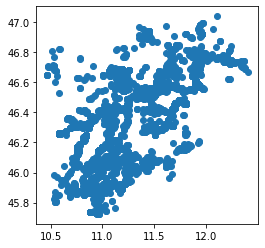

In [13]:
geo_airbnb.plot()
plt.show()

## change colors

https://matplotlib.org/3.3.2/tutorials/colors/colors.html

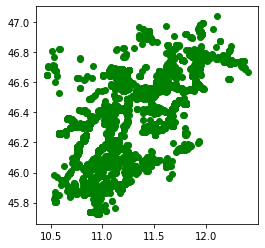

In [14]:
geo_airbnb.plot(color="green")
plt.show()

![](https://xkcd.com/s/0b7742.png)

... everybody loves XKCD

Colors<br/>
https://xkcd.com/color/rgb/

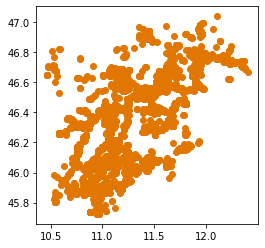

In [15]:
ax = geo_airbnb.plot(color="xkcd:pumpkin")

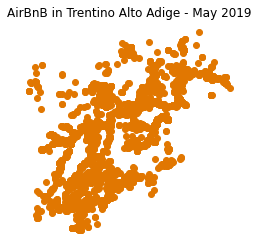

In [16]:
ax = geo_airbnb.plot(color="xkcd:pumpkin")
ax.set_axis_off()
ax.set_title('AirBnB in Trentino Alto Adige - May 2019')
plt.show()

# add background maps

## Tile Map Service - TMS



[Tile Map Service](https://wiki.osgeo.org/wiki/Tile_Map_Service_Specification)


<img src="https://www.spatineo.com/wp-content/uploads/2015/12/TilePyramid.jpg" width=500px />


Supported scheme: 

*http://{**s**}.**domain.com**/{**z**}/{**x**}/{**y**}.png*

- **s** => subdomain (in there are more as one tms server - usualy a.domain.com b.domain.com ...)
- **domain.com** => the domain (eg. openstreetmap.org)
- **z** => zoom level
- **x** =>  column
- **y** => row

Eg:<br/>
&nbsp;&nbsp;&nbsp;https://tile.openstreetmap.org/18/139191/93190.png

![](https://tile.openstreetmap.org/18/139191/93190.png)



You can use in geopandas with [contextily](https://contextily.readthedocs.io/en/latest/)

In [17]:
 import contextily as cx

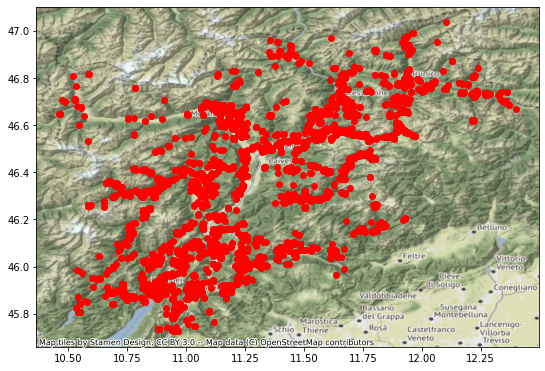

In [18]:
ax = geo_airbnb.plot(color="red", figsize=(9, 9))
cx.add_basemap(ax, crs=geo_airbnb.crs.to_string())

In [19]:
cx.providers.keys()

dict_keys(['OpenStreetMap', 'OpenSeaMap', 'OpenPtMap', 'OpenTopoMap', 'OpenRailwayMap', 'OpenFireMap', 'SafeCast', 'Thunderforest', 'OpenMapSurfer', 'Hydda', 'MapBox', 'Stamen', 'Esri', 'OpenWeatherMap', 'HERE', 'FreeMapSK', 'MtbMap', 'CartoDB', 'HikeBike', 'BasemapAT', 'nlmaps', 'NASAGIBS', 'NLS', 'JusticeMap', 'Wikimedia', 'GeoportailFrance', 'OneMapSG'])

In [20]:
cx.providers.OpenStreetMap.keys()

dict_keys(['Mapnik', 'DE', 'CH', 'France', 'HOT', 'BZH'])

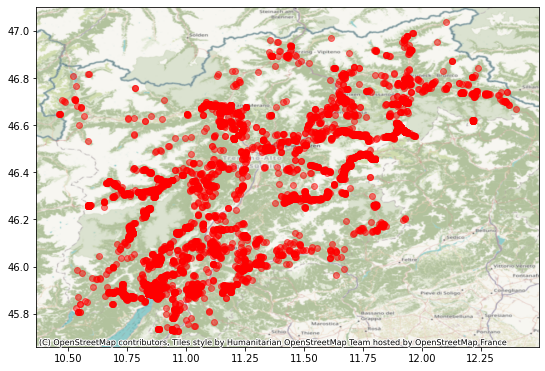

In [21]:
ax = geo_airbnb.plot(alpha=0.5, color="red", figsize=(9, 9))
cx.add_basemap(ax,crs=geo_airbnb.crs.to_string(),
               source=cx.providers.OpenStreetMap.HOT)

## WGS 84 / Pseudo-Mercator
*Spherical Mercator, Google Maps, OpenStreetMap, Bing, ArcGIS, ESRI*

[EPSG:3857](http://epsg.io/3857)

![](https://upload.wikimedia.org/wikipedia/commons/thumb/8/87/Tissot_mercator.png/600px-Tissot_mercator.png)

Variation with latitude of represented distances (in degrees or pixels) on the Mercator projection per actual distances (in meters) on Earth surface.

https://wiki.openstreetmap.org/wiki/Zoom_levels


|  Level |	# Tiles |	Tile width<br/>(° of longitudes) |	m / pixel<br/>(on Equator) |	~ Scale<br/>(on screen) | 	Examples of<br/>areas to represent 	|
|-  |-	|- |- |- |- |   
|0 	|1 	|360 	|156 |412 	|1:500 million |	whole world|
|1 	|4 	|180 	|78.206 |1:250 million| | 	
|2 	|16 |90 	|39.103 |1:150 million |subcontinental area|
|3 	|64 |45 	|19.551 |1:70 million |largest country|
|4 	|256 |22.5 	|9.776 |1:35 million | |	
|5 	|1.024 |11.25 	|4.888 	|1:15 million |large African country|
|6 	|4.096 	|5.625 	|2.444 	|1:10 million |large European country|
|7 	|16.384 |2.813 	|1.222 	|1:4 million 	|small country, US state|
|8 	|65.536 |1.406 	|610.984 	|1:2 million| | 	
|9 	|262.144 |0.703 	|305.492 	|1:1 million |wide area, large metropolitan area|
|10 | 1.048.576 |0.352 	|152.746 	|1:500 thousand |metropolitan area|
|11	| 4.194.304 |0.176 	|76.373 	|1:250 thousand |city|
|12 | 16.777.216 |0.088 	|38.187 	|1:150 thousand |town, or city district|
|13 | 67.108.864 	|0.044 	|19.093 	|1:70 thousand |village, or suburb|
|14 | 268.435.456 	|0.022 	|9.547 	|1:35 thousand 	| |
|15 | 1.073.741.824 	|0.011 	|4.773 	|1:15 thousand |small|road|
|16 | 4.294.967.296 	|0.005 	|2.387 	|1:8 thousand 	|street|
|17 |17.179.869.184 	|0.003 	|1.193 	|1:4 thousand 	|block, park, addresses|
|18 |68.719.476.736 	|0.001 	|0.596 	|1:2 thousand |some buildings, trees|
|19 |274.877.906.944 	|0.0005 	|0.298 	|1:1 thousand|	local highway and crossing details|
|20 |1.099.511.627.776 	|0.00025 	|0.149 	|1:5 hundred |A mid-sized building |

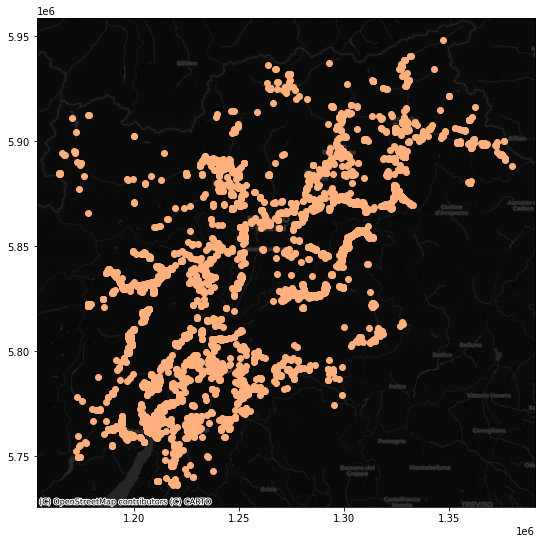

In [22]:
ax = geo_airbnb.to_crs(epsg=3857).plot(color='xkcd:peach',figsize=(9,9))
cx.add_basemap(ax,crs=geo_airbnb.to_crs(epsg=3857).crs.to_string(),
               source=cx.providers.CartoDB.DarkMatter)

# Visualize dots (with seaborn)

create a scatterplot to know the spatial distributions of the points

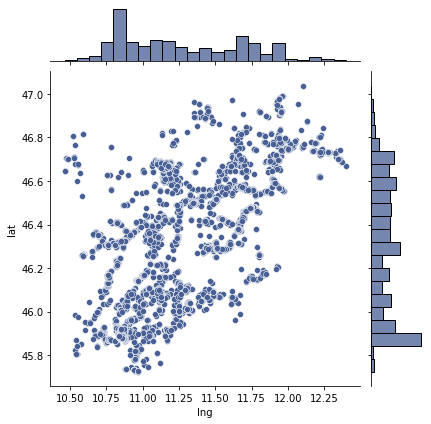

In [23]:
sns.jointplot(x='lng', y='lat', color="xkcd:dusky blue", data=geo_airbnb);

prepare the data to have x and y in epsg:3857

In [24]:
geo_airbnb['x'] = geo_airbnb.to_crs(epsg=3857).geometry.x
geo_airbnb['y'] = geo_airbnb.to_crs(epsg=3857).geometry.y

Download map tiles 

*bounds2img*




In [25]:
bounding_box = [geo_airbnb.x.min(), geo_airbnb.y.min(), geo_airbnb.x.max(), geo_airbnb.y.max()]

In [26]:
basemap, basemap_extent = cx.bounds2img(*bounding_box, zoom=10,source = cx.providers.Stamen.Toner)

- *basemap* is an array containing the raw image data for a basemap of the area
- *basemap_extent* is the boundary of that image

everything in EPSG:3857

create a bounding box to define the extent of the data


In [27]:
data_extent = [geo_airbnb.x.min(), geo_airbnb.x.max(), geo_airbnb.y.min(), geo_airbnb.y.max()]

### plot dots

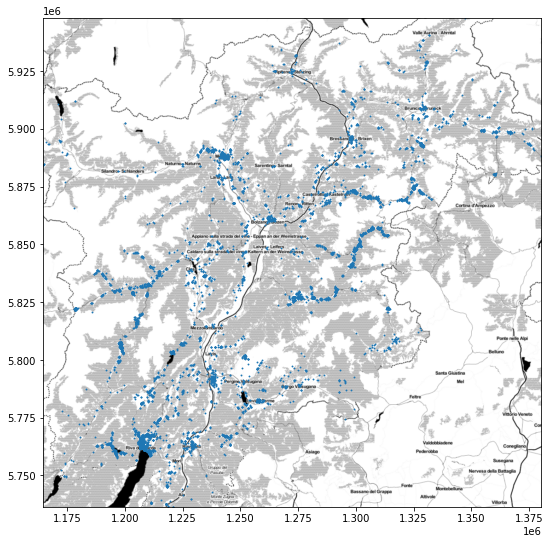

In [28]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Add map tiles for context
ax.imshow(basemap, extent=basemap_extent, interpolation='bilinear')
# Plot points
ax.scatter(geo_airbnb['x'], geo_airbnb['y'], s=0.75) #s = size
# Limit the axis
ax.axis(data_extent)
# Display
plt.show()

### plot Hexagons

There may be cases of points that are very close to each other or even concentric.

The view in dots can then create a map that hides this information.

A common solution is to create a grid (such as hexagons or squares) in which to color, for each cell, the value of the points contained.

The use of hexagonal binning (sometimes called hexbin) has nicer properties than squared grids, such as larger flexibility in the shape and better connectivity between cells.

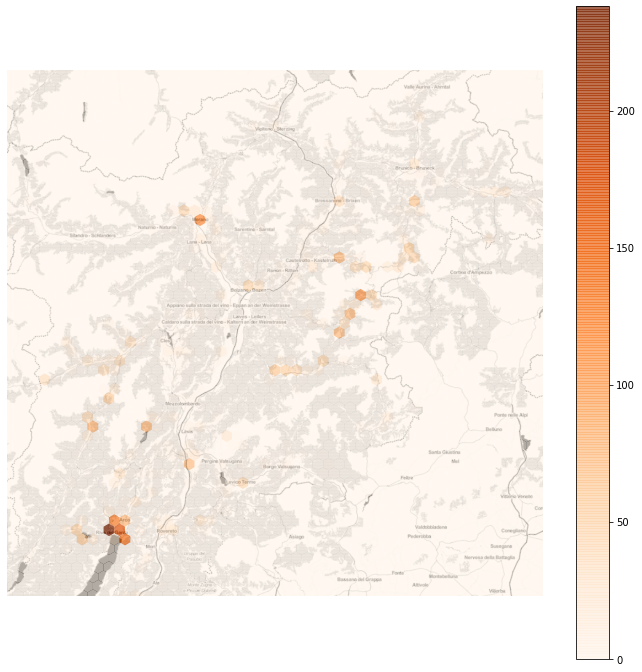

In [29]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(12, 12))
# Add map tiles for context
ax.imshow(basemap, extent=basemap_extent, interpolation='bilinear')
# Generate and add hexbin with 50 hexagons in each 
# dimension, no borderlines, half transparency,
# and the reverse Oranges colormap
hb = ax.hexbin(x=geo_airbnb['x'], 
               y=geo_airbnb['y'],
               gridsize=50, linewidths=0,
               alpha=0.7, cmap='Oranges')
ax.axis(data_extent)
# Add colorbar
plt.colorbar(hb)
# Remove axes
ax.set_axis_off()

### plot heatmap (KDE)
Kernel Density Estimation (KDE) a non-parametric way to estimate the probability density function of a random variable<br/><br/>

"KDE lays a grid of points over the space of interest on which it places kernel functions that count points around them with different weight based on the distance. These counts are then aggregated to generate a global surface with probability. The most common kernel function is the gaussian one, which applies a normal distribution to weight points. The result is a continuous surface with a probability function that may be evaluated at every point"

source [Rey, S.J., D. Arribas-Bel, and L.J. Wolf (2020) "Geographic Data Science with PySAL and the PyData Stack”.](https://geographicdata.science/book/notebooks/08_point_pattern_analysis.html#kernel-density-estimation-kde)

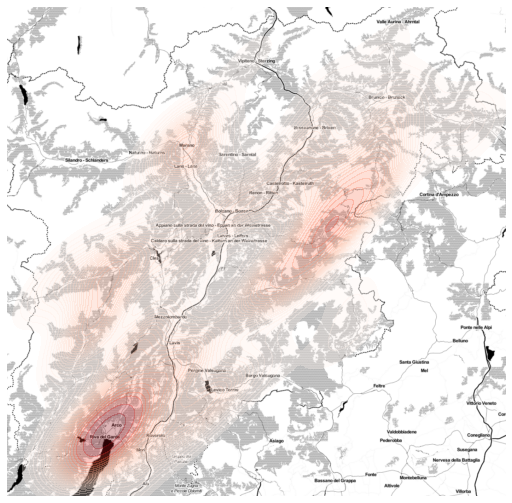

In [30]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Add map tiles for context
ax.imshow(basemap, extent=basemap_extent, interpolation='bilinear')
# Generate and add KDE with a shading of 50 gradients 
# coloured contours, 30% of transparency,
# and the reverse Reds colormap
sns.kdeplot(x=geo_airbnb['x'], y=geo_airbnb['y'],
                n_levels=30, shade=True,
                alpha=0.3, cmap='Reds')
# Remove axes
ax.axis(data_extent)
ax.set_axis_off()

<img src="https://imgs.xkcd.com/comics/heatmap_2x.png" width="500px" />

source: https://xkcd.com/1138/

explanation: https://www.explainxkcd.com/wiki/index.php/1138:_Heatmap



### create and plot cluster

A common algorithm to identify clusters of points, based on their density across space, is DBSCAN.<br/>
For this method, a cluster is a concentration of at least *m8 points, each of them within a distance of *r* of at least another point in the cluster. 

In [31]:
from sklearn.cluster import dbscan
import numpy as np

Compute DBSCAN

In [32]:
# Obtain the number of points 1% of the total represents
minp = np.round(geo_airbnb.shape[0] * 0.01)
minp

62.0

obtain the cluster of points within **800 meters** for the number of point *1%* of the total represents

In [33]:
clusterindexes, labels = dbscan(geo_airbnb[['x', 'y']], eps=800, min_samples=minp)

In [34]:
clusterindexes[:3]

array([26, 28, 32])

In [35]:
labels[:3]

array([-1, -1, -1])

In [36]:
labels = pd.Series(labels, index=geo_airbnb.index)

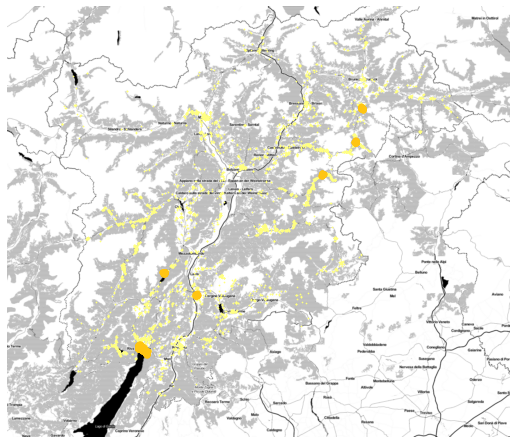

In [37]:
# Setup figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Add base layer with tiles for context
ax.imshow(basemap, extent=basemap_extent, interpolation='bilinear')

# Subset points that are not part of any cluster (noise)
noise = geo_airbnb.loc[labels==-1, ['x', 'y']]
# Plot noise in butter color
ax.scatter(noise['x'], noise['y'], c='xkcd:butter', s=3, linewidth=0)


# Plot all points that are not noise in sunflower color
# NOTE how this is done through some fancy indexing, where
#      we take the index of all points (tw) and substract from
#      it the index of those that are noise
ax.scatter(geo_airbnb.loc[geo_airbnb.index.difference(noise.index), 'x'], \
           geo_airbnb.loc[geo_airbnb.index.difference(noise.index), 'y'], \
          c='xkcd:sunflower', linewidth=0)
# Remove axes
ax.set_axis_off()
# Display the figure
plt.show()



# Choropleth maps

Choropleth maps play a prominent role in geographic data science as they allow us to display non-geographic attributes or variables on a geographic map. The word choropleth stems from the root “choro”, meaning “region”. As such choropleth maps represent data at the region level, and are appropriate for areal unit data where each observation combines a value of an attribute and a geometric figure, usually a polygon.

source [Rey, S.J., D. Arribas-Bel, and L.J. Wolf (2020) "Geographic Data Science with PySAL and the PyData Stack”](https://geographicdata.science/book/notebooks/05_choropleth.html)


In [38]:
url_italian_administrative_units="https://github.com/napo/geospatial_course_unitn/raw/master/data/administrative_units_italy_2020/istat_administrative_units_2020.gpkg"

In [39]:
italian_regions = gpd.read_file(url_italian_administrative_units,layer="regions")



add labels to the map


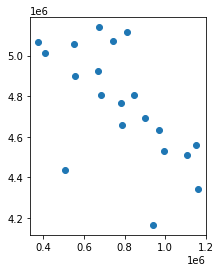

In [40]:
italian_regions.representative_point().plot()

In [41]:
representative_points = gpd.GeoDataFrame(italian_regions.representative_point()).reset_index()

In [42]:
representative_points = representative_points.rename(columns={0:'geometry'}).set_geometry('geometry')

In [43]:
labels = italian_regions.DEN_REG.to_frame().reset_index()

In [44]:
representative_points = representative_points.merge(labels,on="index")

In [45]:
representative_points = representative_points.rename(columns={'DEN_REG':'names'})

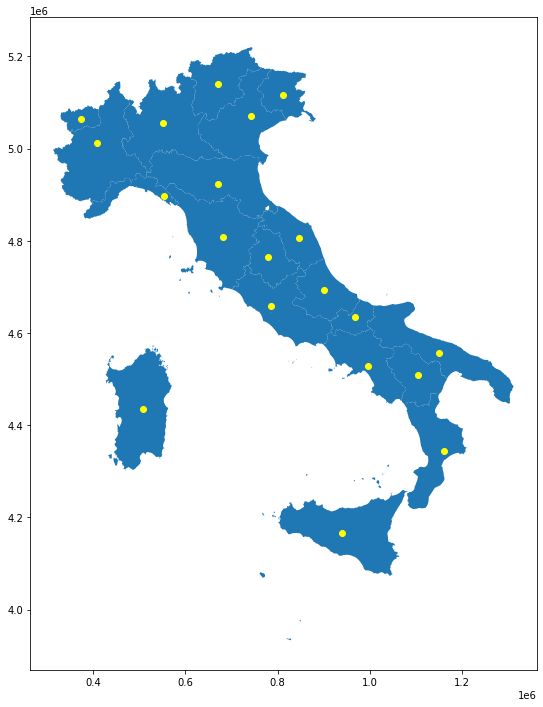

In [46]:
f, canvas = plt.subplots(1,figsize = (12, 12))
italian_regions.plot(ax=canvas,figsize=(12,11))
representative_points.plot(ax=canvas,color='yellow')
plt.show()

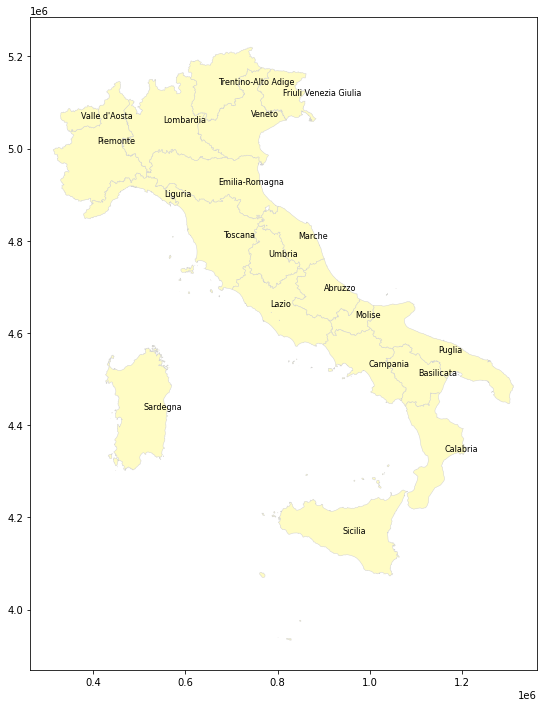

In [47]:
texts = []
canvas = italian_regions.plot(figsize = (12, 12), color = "xkcd:egg shell", edgecolor = "lightgrey", linewidth = 0.5)

for x, y, label in zip(representative_points.geometry.x, representative_points.geometry.y, representative_points["names"]):
    texts.append(plt.text(x, y, label, fontsize = 8))

In [48]:
italian_regions.columns

Index(['COD_RIP', 'COD_REG', 'DEN_REG', 'geometry'], dtype='object')

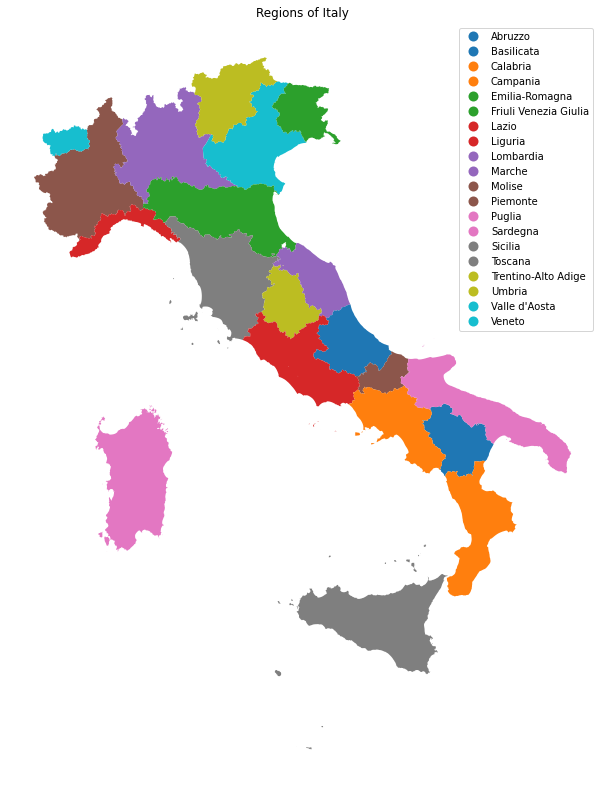

In [49]:
ax = italian_regions.plot(column='DEN_REG',legend=True,figsize=(14,14))
ax.set_title("Regions of Italy")
ax.set_axis_off()
plt.show()

Change of the color scale

the [color scale](https://matplotlib.org/users/colormaps.html) can be chosen to make those offered by maptplotlib

*DEN_REG* is a categorical variable that must highlight each region well without creating confusion, therefore it is suggested to choose a color scale from among those described as [*divergent*](https://matplotlib.org/tutorials/colors/colormaps.html#diverging)


Tip<br/>
A suggestion to choose a good color scale is [Color Brewer 2](https://colorbrewer2.org/#type=sequential&scheme=BuGn&n=3)


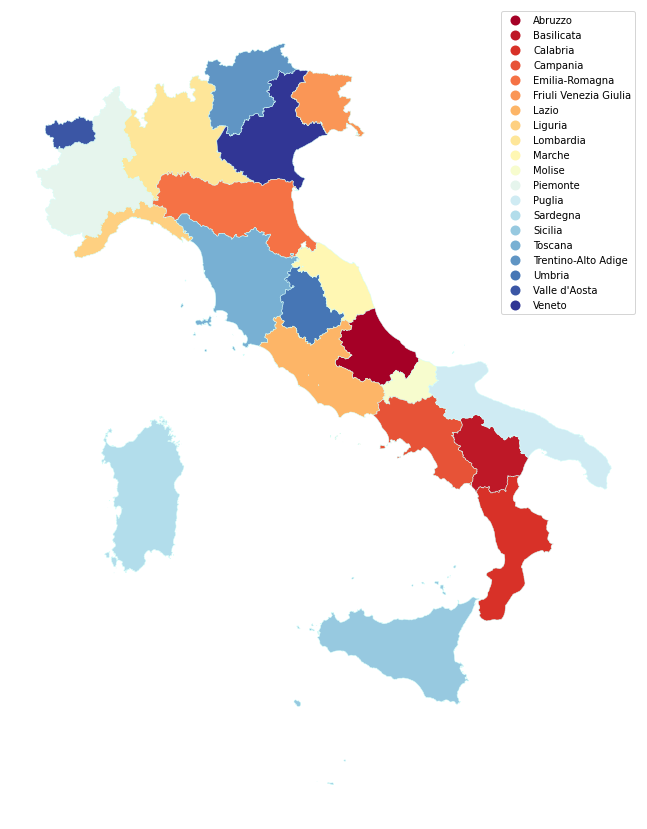

In [50]:
ax = italian_regions.plot(column='DEN_REG',legend=True,figsize=(15, 15),cmap="RdYlBu", edgecolor = "xkcd:ice", linewidth = 0.5)
ax.set_axis_off()
plt.show()

## add attributes from other sources
[COVID-19 in Italy](https://github.com/pcm-dpc/COVID-19)

dataset for the italian regions:<br/>
https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-regioni/dpc-covid19-ita-regioni-latest.csv

In [51]:
url='https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-regioni/dpc-covid19-ita-regioni-latest.csv'

In [52]:
covid19_italian_regions = pd.read_csv(url)

In [53]:
covid19_italian_regions.columns

Index(['data', 'stato', 'codice_regione', 'denominazione_regione', 'lat',
       'long', 'ricoverati_con_sintomi', 'terapia_intensiva',
       'totale_ospedalizzati', 'isolamento_domiciliare', 'totale_positivi',
       'variazione_totale_positivi', 'nuovi_positivi', 'dimessi_guariti',
       'deceduti', 'casi_da_sospetto_diagnostico', 'casi_da_screening',
       'totale_casi', 'tamponi', 'casi_testati', 'note'],
      dtype='object')

In [54]:
covid19_italian_regions.head(5)

,data,stato,codice_regione,denominazione_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,totale_positivi,variazione_totale_positivi,nuovi_positivi,dimessi_guariti,deceduti,casi_da_sospetto_diagnostico,casi_da_screening,totale_casi,tamponi,casi_testati,note
0,2020-11-05T17:00:00,ITA,13,Abruzzo,42.351222,13.398438,458,36,494,7770,8264,232,571,4273,577,7339,5775,13114,305438,188627,NaN
1,2020-11-05T17:00:00,ITA,17,Basilicata,40.639471,15.805148,90,16,106,2015,2121,127,135,746,56,1079,1844,2923,111519,110599,NaN
2,2020-11-05T17:00:00,ITA,18,Calabria,38.905976,16.594402,217,11,228,4016,4244,351,358,2078,128,1218,5232,6450,289361,286339,NaN
3,2020-11-05T17:00:00,ITA,15,Campania,40.839566,14.250850,1608,174,1782,56266,58048,3560,3888,14697,756,70863,2638,73501,1051304,721021,NaN
4,2020-11-05T17:00:00,ITA,8,Emilia-Romagna,44.494367,11.341721,1588,177,1765,30211,31976,2002,2180,28403,4712,45945,19146,65091,1674462,890032,In seguito a verifica sui dati sono stati elim...


In [55]:
covid19_italian_regions.denominazione_regione.unique()

array(['Abruzzo', 'Basilicata', 'Calabria', 'Campania', 'Emilia-Romagna',
       'Friuli Venezia Giulia', 'Lazio', 'Liguria', 'Lombardia', 'Marche',
       'Molise', 'P.A. Bolzano', 'P.A. Trento', 'Piemonte', 'Puglia',
       'Sardegna', 'Sicilia', 'Toscana', 'Umbria', "Valle d'Aosta",
       'Veneto'], dtype=object)

*P. A. Bolzano* and *P.A. Trento* are provinces => these aren't present in the dataset regions


The autonomous provinces of Trento and Bolzano, for some competences such as healthcare, are equated to the Italian regions.
So you need to create a layer that has this distinction
- delete the Trentino Alto Adige region from the original layer
- extract the provinces of Trento and Bolzano
- align the attributes of these two provinces with those of the regions
- merge the extracted geometries to the regions layer

delete the Trentino Alto Adige region from the original layer

In [56]:
italian_regions[italian_regions.COD_REG == 4]

,COD_RIP,COD_REG,DEN_REG,geometry
4,2,4,Trentino-Alto Adige,"MULTIPOLYGON (((743267.749 5219765.793, 743387..."


In [57]:
italian_regions = italian_regions[italian_regions.COD_REG != 4]

extract the provinces of Trento and Bolzano

In [58]:
italian_provincies = gpd.read_file(url_italian_administrative_units,layer="provincies")

In [59]:
trento_bolzano = italian_provincies[italian_provincies.COD_REG==4]

align the attributes of these two provinces with those of the regions

In [60]:
trento_bolzano = trento_bolzano.drop(columns=['COD_REG'])

In [61]:
trento_bolzano.rename(columns={'COD_PROV':'COD_REG'},inplace=True)

In [62]:
trento_bolzano.rename(columns={'DEN_PROV':'DEN_REG'},inplace=True)

In [63]:
italian_regions.columns

Index(['COD_RIP', 'COD_REG', 'DEN_REG', 'geometry'], dtype='object')

In [64]:
trento_bolzano.columns

Index(['COD_RIP', 'COD_REG', 'COD_CM', 'COD_UTS', 'DEN_REG', 'DEN_CM',
       'DEN_UTS', 'SIGLA', 'TIPO_UTS', 'geometry'],
      dtype='object')

In [65]:
trento_bolzano = trento_bolzano[['COD_RIP','COD_REG','DEN_REG','geometry']]

merge the extracted geometries to the regions layer

In [66]:
italian_regions = italian_regions.append(trento_bolzano)

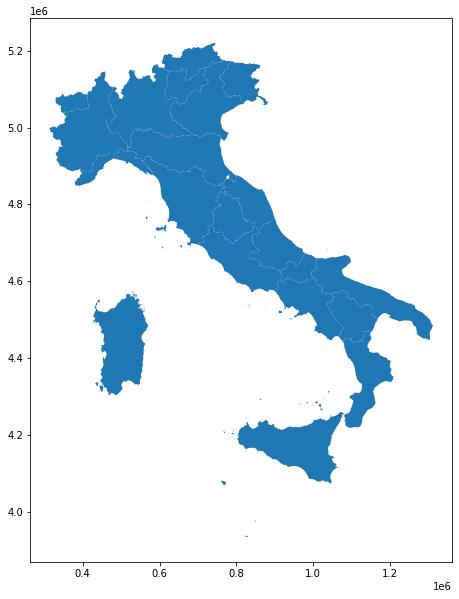

In [67]:
italian_regions.plot(figsize=(10,10))
plt.show()

In [68]:
import pandas_profiling 

In [69]:
covid19_italian_regions.profile_report()

In [70]:
italian_regions.columns

Index(['COD_RIP', 'COD_REG', 'DEN_REG', 'geometry'], dtype='object')

In [71]:
covid19_italian_regions.columns

Index(['data', 'stato', 'codice_regione', 'denominazione_regione', 'lat',
       'long', 'ricoverati_con_sintomi', 'terapia_intensiva',
       'totale_ospedalizzati', 'isolamento_domiciliare', 'totale_positivi',
       'variazione_totale_positivi', 'nuovi_positivi', 'dimessi_guariti',
       'deceduti', 'casi_da_sospetto_diagnostico', 'casi_da_screening',
       'totale_casi', 'tamponi', 'casi_testati', 'note'],
      dtype='object')

In [72]:
italian_regions.rename(columns={'COD_REG':'codice_regione'},inplace=True)

In [73]:
geo_covid19_italian_regions = italian_regions.merge(covid19_italian_regions,on="codice_regione").reset_index()

In [74]:
geo_covid19_italian_regions.columns

Index(['index', 'COD_RIP', 'codice_regione', 'DEN_REG', 'geometry', 'data',
       'stato', 'denominazione_regione', 'lat', 'long',
       'ricoverati_con_sintomi', 'terapia_intensiva', 'totale_ospedalizzati',
       'isolamento_domiciliare', 'totale_positivi',
       'variazione_totale_positivi', 'nuovi_positivi', 'dimessi_guariti',
       'deceduti', 'casi_da_sospetto_diagnostico', 'casi_da_screening',
       'totale_casi', 'tamponi', 'casi_testati', 'note'],
      dtype='object')

No handles with labels found to put in legend.


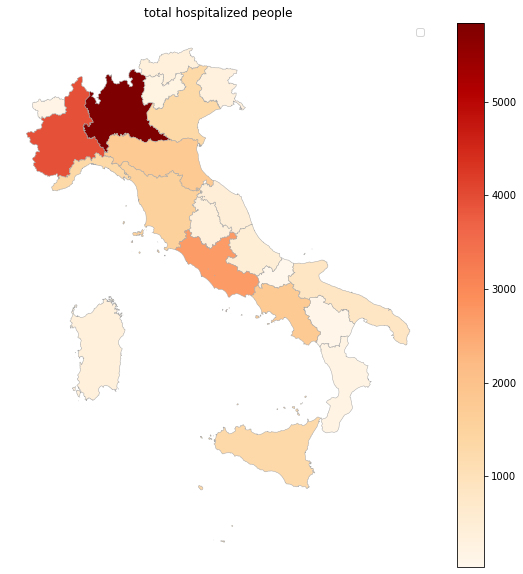

In [75]:
ax = geo_covid19_italian_regions.plot(column='totale_ospedalizzati',
                                      cmap="OrRd", edgecolor = "darkgrey", 
                                      linewidth = 0.5,legend=True,figsize=(10,10))
ax.set_axis_off()
ax.set_title('total hospitalized people')
ax.legend(loc='best')
plt.show()

Use a better schema<br/>
[mapclassify schemas](https://github.com/pysal/mapclassify)

## equal interval


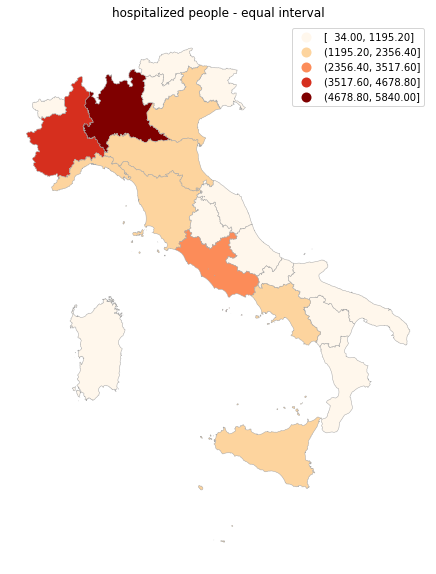

In [76]:
ax = geo_covid19_italian_regions.plot(column='totale_ospedalizzati',
                                      cmap="OrRd", edgecolor = "darkgrey", 
                                      linewidth = 0.5,legend=True,figsize=(10,10),
                                      scheme="equal_interval")
ax.set_title('hospitalized people - equal interval')

ax.set_axis_off()
plt.show()

## quantiles

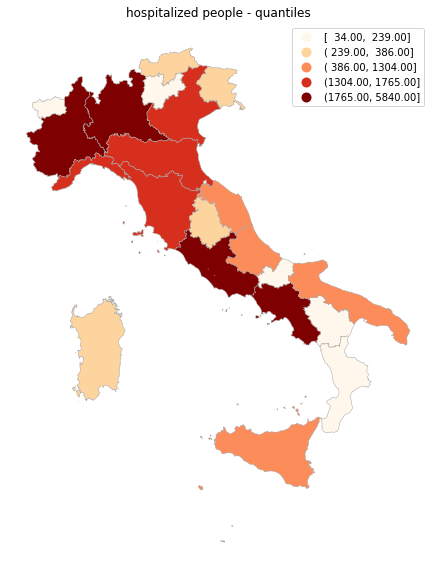

In [77]:
ax = geo_covid19_italian_regions.plot(column='totale_ospedalizzati',
                                      cmap="OrRd", edgecolor = "darkgrey", 
                                      linewidth = 0.5,legend=True,figsize=(10,10),
                                      scheme="quantiles")
ax.set_axis_off()
ax.set_title('hospitalized people - quantiles')

plt.show()

## percentiles

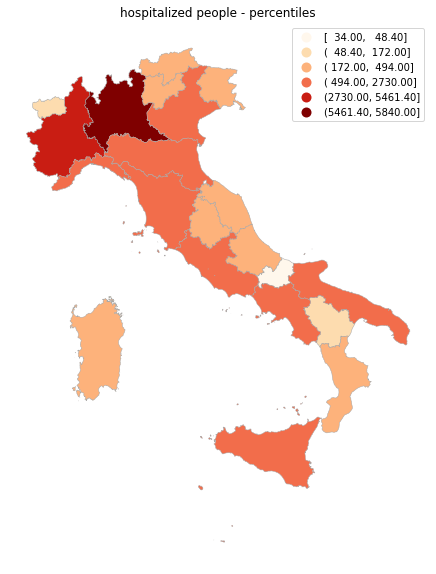

In [78]:
ax = geo_covid19_italian_regions.plot(column='totale_ospedalizzati',
                                      cmap="OrRd", edgecolor = "darkgrey", 
                                      linewidth = 0.5,legend=True,figsize=(10,10),
                                      scheme="percentiles")
ax.set_axis_off()
ax.set_title('hospitalized people - percentiles')

plt.show()

## natural breaks

this method seeks to reduce the variance within classes and maximize the variance between classes.

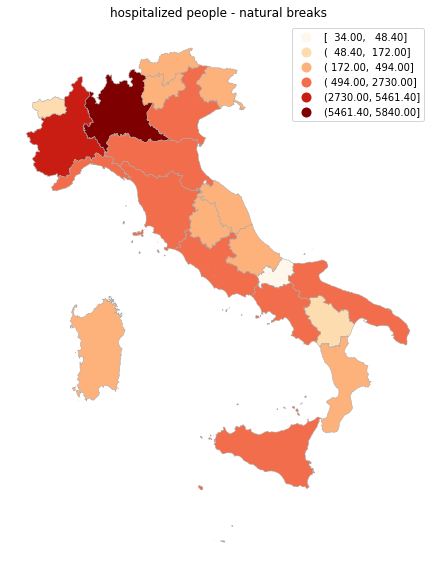

In [79]:
ax = geo_covid19_italian_regions.plot(column='totale_ospedalizzati',
                                      cmap="OrRd", edgecolor = "darkgrey", 
                                      linewidth = 0.5,legend=True,figsize=(10,10),
                                      scheme="percentiles")
ax.set_axis_off()
ax.set_title('hospitalized people - natural breaks')

plt.show()

---
**Readings**<br/>
- theoretical background <br/>
[Rey, S.J., D. Arribas-Bel, and L.J. Wolf (2020) "Geographic Data Science with PySAL and the PyData Stack”.](https://geographicdata.science/book/notebooks/05_choropleth.html)
- thoughts & how to<br/>
[What to consider when creating choropleth maps](https://blog.datawrapper.de/choroplethmaps/) - Lisa Charlotte Rost, Datawrapper




![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/election_data_usa.gif)

---
# Exercise<br/>
create a map with distribution of votes by polling station (seggi elettorali) of the mayoral candidates of the municipal 2020 of Trento<br/>
Data available here:
- [distribution of the votes](https://www.comune.trento.it/content/download/1296207/12436441/file/Voti_Sindaco_(csv).csv) - csv file
- [addresses of the polling stations](https://www.comune.trento.it/content/download/1262240/12138091/file/Seggi%202020_.pdf) - pdf file :/